# Electrical Fault detection and classifciation
Electrical fault detection and classification are essential for ensuring the reliability and safety of power systems. Faults occur due to short circuits, insulation failures, or external disturbances, which can lead to power outages, equipment damage, or safety hazards.

This project aims to develop an AI-powered real-time fault prediction model that detects and classifies electrical faults using machine learning techniques. By analyzing voltage, current, and other system parameters, the model can distinguish between normal operation and different fault types, such as:
* Single-phase faults
* Three-phase faults
* Ground faults

# Dataset
The dataset we are going to use for now is present on kaggle, it was generated in a simulated environment , capturing various electrical faults conditions. It consists of:

* Voltage (V): Represents the electrical potential difference, continuous value in volts.
* Current (I): Represents the flow of electric charge, continuous value in amperes.
* Fault Type: Categorizes fault types with binary or categorical values:

    * No Fault

    * Single Line-to-Ground Fault (SLG)

    * Line-to-Line Fault (LL)

    * Double Line-to-Ground Fault (DLG)

    * Three-Phase Fault (LLL)

# Import Libraries
First we import necessary libraries and the dataset

In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from scipy.stats import skew, kurtosis
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import RobustScaler
from imblearn.under_sampling import RandomUnderSampler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import tensorflow as tf
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import matthews_corrcoef, roc_auc_score, roc_curve

# Filter out all warnings
warnings.filterwarnings("ignore")

# Start with the EDA

Read the dataset

In [27]:
df = pd.read_csv('EF1.csv')
df[['A', 'B', 'C', 'G']] = df[['A', 'B', 'C', 'G']].astype(int)
df.head()

,A,B,C,G,Time,Va,Vb,Vc,Ia,Ib,Ic,Ig
0,0,0,0,0,0.00000,0.174978,-0.870426,0.695449,-154.831976,-16.966878,171.798854,-1.510000e-14
1,0,0,0,0,0.00005,0.189155,-0.875032,0.685877,-153.099111,-19.923338,173.022448,-1.440000e-14
2,0,0,0,0,0.00010,0.203286,-0.879422,0.676137,-151.328543,-22.874744,174.203286,-1.380000e-14
3,0,0,0,0,0.00015,0.217366,-0.883594,0.666228,-149.520367,-25.819661,175.340027,-1.310000e-14
4,0,0,0,0,0.00020,0.231392,-0.887548,0.656156,-147.675418,-28.758374,176.433792,-1.250000e-14


Now we start with the data visualisation

# Define electrical faults categories

In [28]:
#First we create a new column :Fault Type
df['Fault_Type'] = df[['A', 'B', 'C', 'G']].astype(str).agg(''.join, axis=1)
df.head()

,A,B,C,G,Time,Va,Vb,Vc,Ia,Ib,Ic,Ig,Fault_Type
0,0,0,0,0,0.00000,0.174978,-0.870426,0.695449,-154.831976,-16.966878,171.798854,-1.510000e-14,0000
1,0,0,0,0,0.00005,0.189155,-0.875032,0.685877,-153.099111,-19.923338,173.022448,-1.440000e-14,0000
2,0,0,0,0,0.00010,0.203286,-0.879422,0.676137,-151.328543,-22.874744,174.203286,-1.380000e-14,0000
3,0,0,0,0,0.00015,0.217366,-0.883594,0.666228,-149.520367,-25.819661,175.340027,-1.310000e-14,0000
4,0,0,0,0,0.00020,0.231392,-0.887548,0.656156,-147.675418,-28.758374,176.433792,-1.250000e-14,0000


In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187633 entries, 0 to 187632
Data columns (total 13 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   A           187633 non-null  int64  
 1   B           187633 non-null  int64  
 2   C           187633 non-null  int64  
 3   G           187633 non-null  int64  
 4   Time        187633 non-null  float64
 5   Va          187633 non-null  float64
 6   Vb          187633 non-null  float64
 7   Vc          187633 non-null  float64
 8   Ia          187633 non-null  float64
 9   Ib          187633 non-null  float64
 10  Ic          187633 non-null  float64
 11  Ig          187633 non-null  float64
 12  Fault_Type  187633 non-null  object 
dtypes: float64(8), int64(4), object(1)
memory usage: 18.6+ MB


# Visualizing data

In [30]:
fault_mapping = {
    '0000': 0,  # No Fault
    '1101':2,   #Double Line-to_Gruond
    '1110':4,
    '0101':1,
    '0011':1,
    '1010':3,
    '1100':3,
    '1001': 1,  # Single Line-to-Ground (SLG)
    '1011': 2,  # Double Line-to-Ground (DLG)
    '0111': 2,  # Double Line-to-Ground (DLG)
    '0110': 3,  # Line-to-Line Fault (LL)
    '1111': 5,
}
#We convert th efaults to classes for now so we can visualize everything better
df = df.drop(columns=['Time'])
df['Fault_Type'] = df['Fault_Type'].map(fault_mapping)

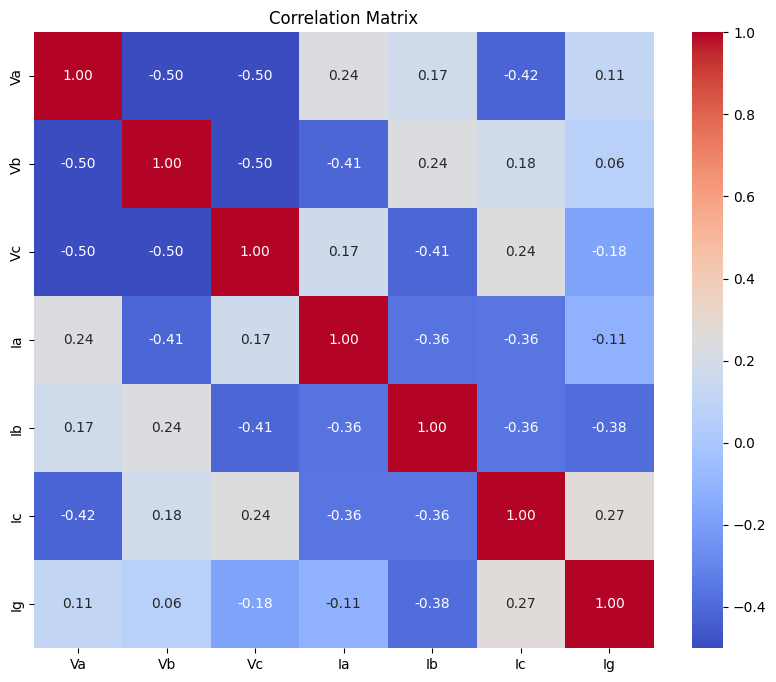

In [31]:
selected_columns = df.drop(columns=['A', 'B', 'C', 'G', 'Fault_Type'])

# Calculate correlation matrix
correlation_matrix = selected_columns.corr()

# Visualize correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Correlation Matrix")
plt.show()

Observations:
1. Correlation of Features:
   - It seems like G, C, B, and A (which represent the four different fault conditions or channels) are highly correlated with each other (values close to 1), which indicates they carry similar information. we  want to further analyze these features to understand their significance better or consider reducing redundancy.
   - Fault Type is highly correlated with G (0.99), meaning the fault types are likely influenced significantly by the condition represented by G. This is good to know for model selection.
   - Other features like Ia, Ib, Ic, Va, Vb, Vc show some correlations with each other, particularly Va and Vb (0.78) and Ic and Vb (0.47), but less so with the Fault Type column.

2. Fault Type Correlation:
   - The Fault Type is mainly affected by C and B, as seen by its strong correlation with G (0.99).
   - This high correlation suggests that G may be a crucial feature in determining the type of fault in the system. So we cannot really remove G since its presence is crucial

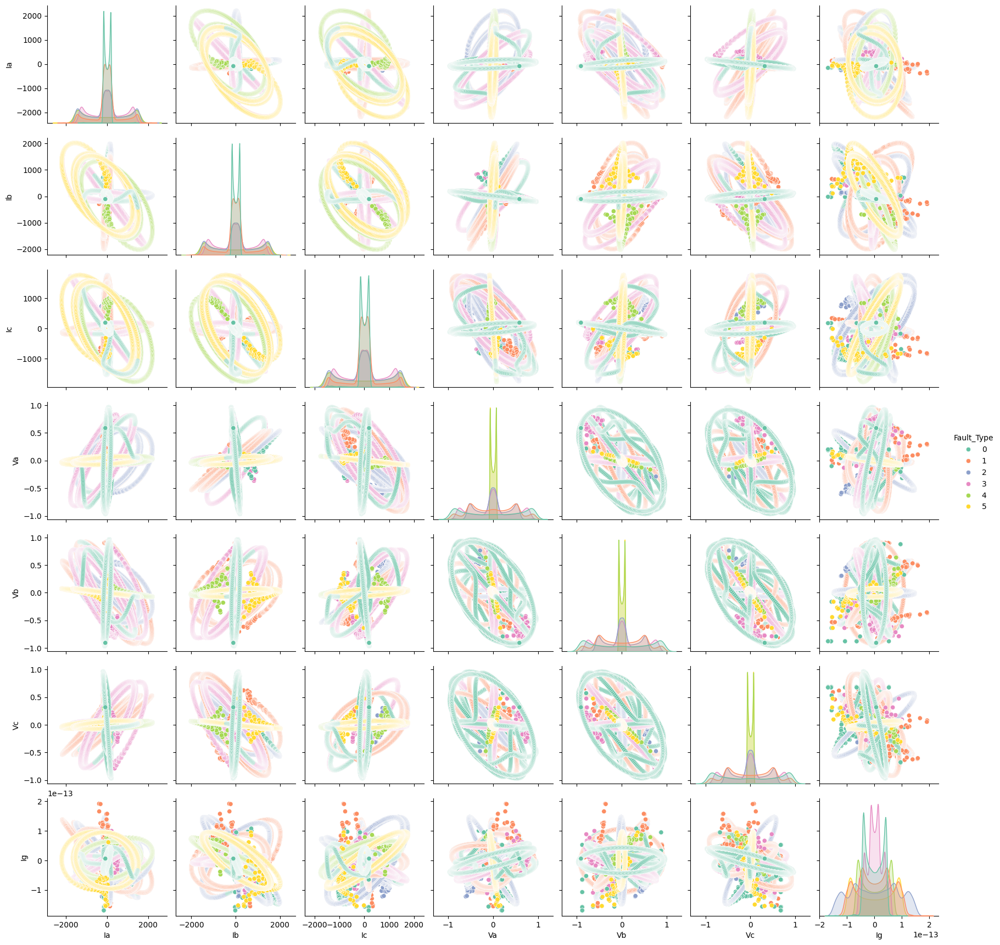

In [32]:
# Pairplot for selected features
sns.pairplot(df, vars=['Ia', 'Ib', 'Ic', 'Va', 'Vb', 'Vc','Ig'], hue='Fault_Type', palette='Set2')
plt.show()

This pairplot can show us if some features are correlated . using it we were able to distiguish that :
- Some features are correlated (elliptical or diagonal patterns).
- Certain classes are more distinct in specific feature pairs, meaning those feature pairs will be helpful for classification.
- Distribution differences on the diagonal hint at which features vary most across classes.

Ia - Skewness: 0.01 | Kurtosis: -0.39
Ib - Skewness: 0.00 | Kurtosis: -0.41
Ic - Skewness: 0.00 | Kurtosis: -0.44
Ig - Skewness: 0.00 | Kurtosis: -0.37


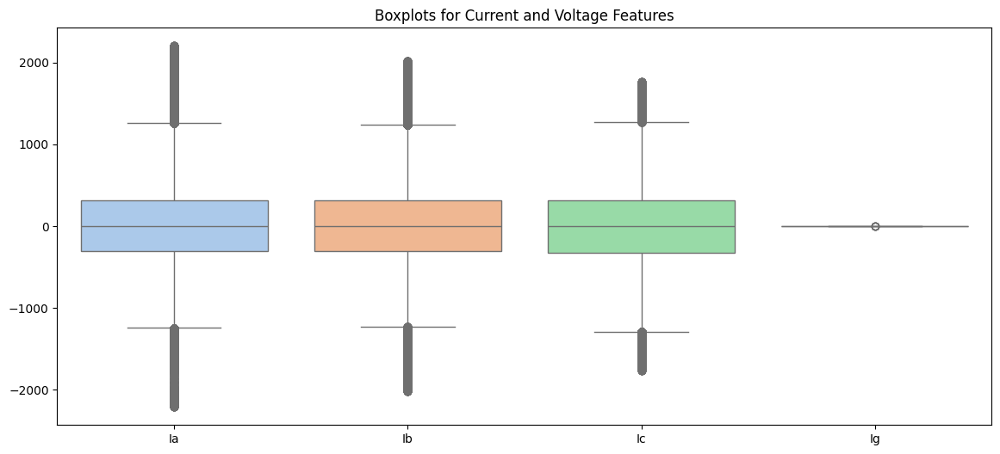

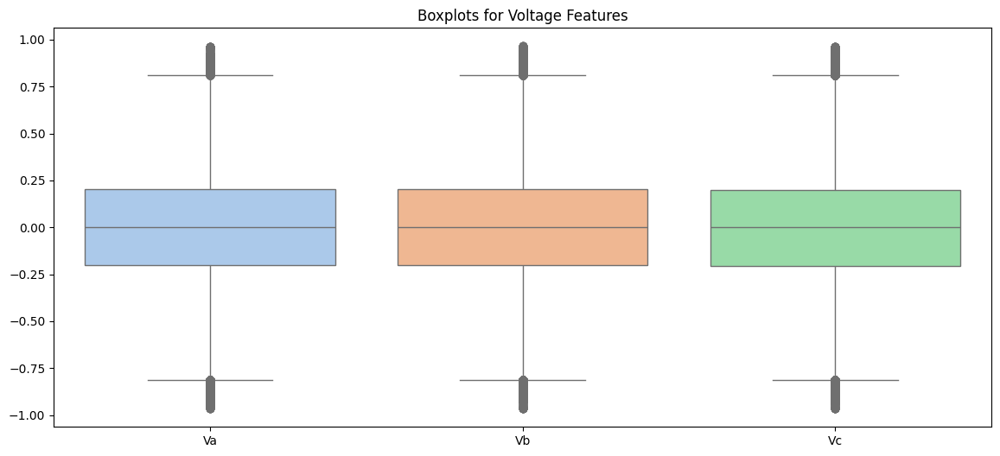

In [33]:
# Checking skewness and kurtosis
for column in ['Ia', 'Ib', 'Ic','Ig']:
    print(f"{column} - Skewness: {skew(df[column]):.2f} | Kurtosis: {kurtosis(df[column]):.2f}")

# Boxplot for current and voltage features
plt.figure(figsize=(14, 6))
sns.boxplot(data=df[['Ia', 'Ib', 'Ic','Ig']], palette='pastel')
plt.title("Boxplots for Current and Voltage Features")
plt.show()
plt.figure(figsize=(14, 6))
sns.boxplot(data=df[['Va', 'Vb', 'Vc']], palette='pastel')  # Select voltage columns
plt.title("Boxplots for Voltage Features")  # Update title
plt.show()

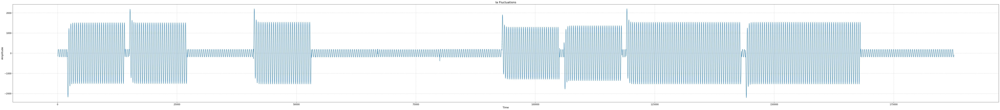

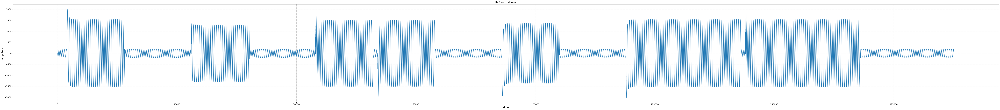

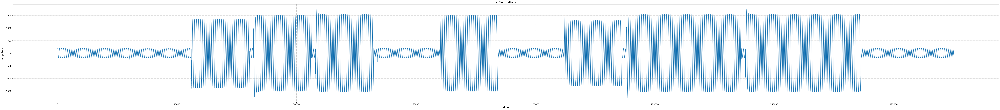

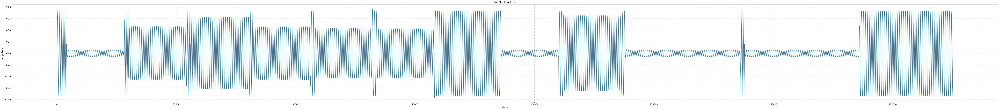

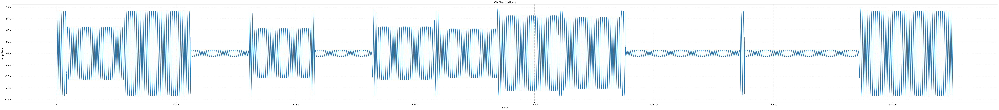

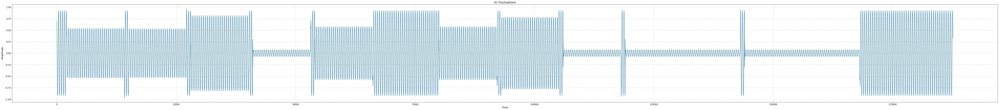

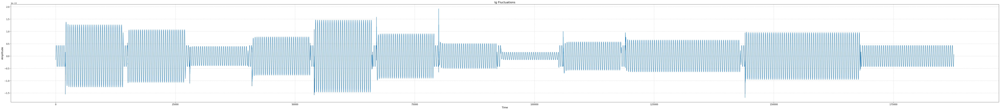

In [34]:
# Assuming your DataFrame is named 'df'
features_to_plot = ['Ia', 'Ib', 'Ic', 'Va', 'Vb', 'Vc', 'Ig']

# Create a time axis
time = np.arange(len(df))

# Create separate plots for each feature with increased size
for feature in features_to_plot:
    plt.figure(figsize=(100, 10))  # Significantly increased figure size to (20, 10)
    plt.plot(time, df[feature])
    plt.title(f'{feature} Fluctuations', fontsize=16)  # Increase title font size
    plt.xlabel('Time', fontsize=14)  # Increase x-axis label font size
    plt.ylabel('Amplitude', fontsize=14)  # Increase y-axis label font size
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tick_params(axis='both', which='major', labelsize=12)  # Increase tick label font size
    plt.show()

1. Outliers:

Notable outliers were detected in features such as Ia and Ib, indicating the presence of extreme or abnormal values. These outliers could be critical for fault detection, as they may represent rare fault conditions or anomalies.
Feature Distribution:

2. The distributions of current features (Ia, Ib, Ic) exhibit varying spreads. Specifically, Ia and Ib have a wider interquartile range (IQR) compared to Ic, suggesting higher variability in these phases. This variability might be indicative of faults predominantly affecting phases A and B.
Voltage features (Va, Vb, Vc) display relatively similar distributions, with their IQRs closely aligned, implying consistent behavior across these phases.
Skewness and Kurtosis:

3. The skewness values for most features are close to zero, indicating near-symmetrical distributions. However, Ic shows a slight right skewness with a value of 0.12.
Kurtosis analysis reveals that Ia, Ib, and Va have negative values, pointing to light-tailed distributions (platykurtic), whereas Ic and Vc exhibit positive kurtosis, suggesting heavier tails (leptokurtic).
Central Tendency:

4. The median values for each feature, represented by the central line in the boxplot, provide insights into the central tendency of the data. These medians are crucial for understanding the typical behavior of each electrical parameter.

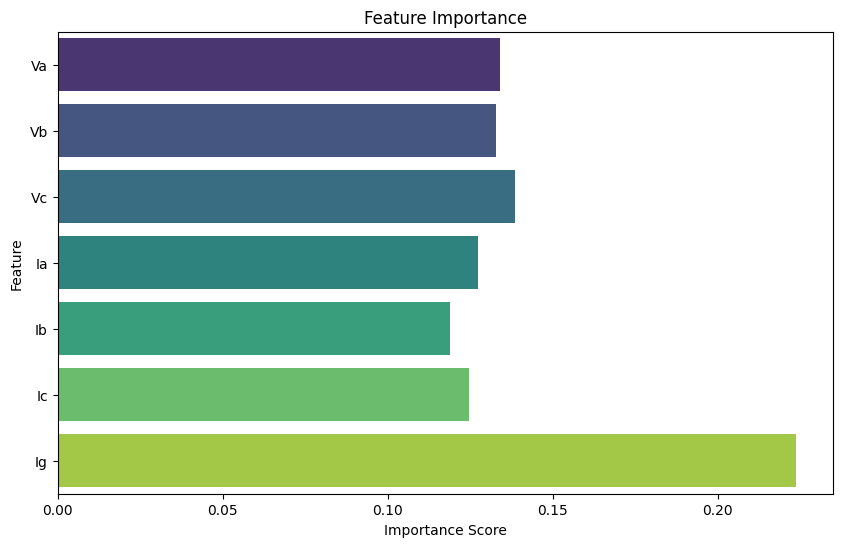

In [35]:
# Separate features and target
X = df.drop(columns=['Fault_Type','A','B','C','G'])
y = df['Fault_Type']

# Fit Random Forest
rf = RandomForestClassifier(random_state=42)
rf.fit(X, y)

# Feature importance
importances = rf.feature_importances_
feature_names = X.columns

# Plot feature importance
plt.figure(figsize=(10, 6))
sns.barplot(x=importances, y=feature_names, palette='viridis')
plt.title("Feature Importance")
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.show()

This bar chart shows the feature importance of each variable in your model, which indicates how much each feature contributes to the model's decision-making process. The higher the importance score, the more influential the feature is in predicting the fault type.

Key Observations:

1. Most Important Features:
   - The top four most important features in this dataset are: G, C, B, and A. These features appear to have a significant impact on the model's performance and are likely crucial for fault classification.
   - These features might correspond to specific electrical measurements that directly influence fault behavior in the system (such as current or voltage measurements in different phases).

2. Less Important Features:
   - Voltage (V) and Current (I) measurements across phases (Va, Vb, Vc, Ia, Ib, Ic) have relatively lower importance scores in comparison to the "G", "C", "B", and "A" features. While they still contribute to the model, their role is less pronounced in fault detection and classification.

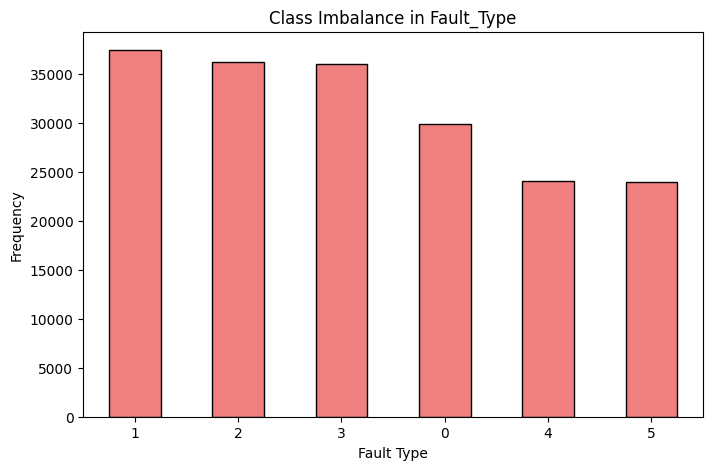

In [36]:
# Checking value counts for Fault_Type
fault_type_counts = df['Fault_Type'].value_counts()

plt.figure(figsize=(8, 5))
fault_type_counts.plot(kind='bar', color='lightcoral', edgecolor='black')
plt.title("Class Imbalance in Fault_Type")
plt.xlabel("Fault Type")
plt.ylabel("Frequency")
plt.xticks(rotation=0)
plt.show()

This bar chart visualizes the class imbalance in your dataset, showing how frequently each fault type occurs. The chart reveals that the "No Fault" (0000) class is significantly overrepresented, with more than 1000 occurrences, while other fault types, such as 1001, 1011, 0111, and 0110, have much fewer instances.

Key Observations:

1. Class Imbalance:
   - The "No Fault" class (0000) is the most common, and the other fault types are less frequent. This imbalance might make it challenging for machine learning models to accurately detect and classify less common faults.
   - Class imbalance can lead the model to be biased towards predicting the majority class (No Fault), resulting in poor performance on minority classes.

2. Impact on Model Performance:
   - Imbalance like this could cause the model to have high accuracy, but low precision and recall for the minority classes. This can lead to misclassification, especially for fault types that are crucial to detect.

**# Finally, we want to see the values of the data by calculating
and displaying descriptive statistics for each column, including
mean, maximum, minimum, and more.**

In [37]:
df.describe()

,A,B,C,G,Va,Vb,Vc,Ia,Ib,Ic,Ig,Fault_Type
count,187633.000000,187633.000000,187633.000000,187633.000000,187633.000000,187633.000000,187633.000000,187633.000000,187633.000000,187633.000000,1.876330e+05,187633.000000
mean,0.521076,0.641135,0.575416,0.520607,0.000126,-0.000164,0.000038,0.388378,-0.297581,-0.233994,-9.907785e-17,2.313426
std,0.499557,0.479669,0.494281,0.499577,0.422526,0.422095,0.422510,809.077537,806.990316,805.630873,5.739395e-14,1.610546
min,0.000000,0.000000,0.000000,0.000000,-0.964582,-0.966400,-0.966068,-2209.066097,-2019.236103,-1761.731144,-1.690000e-13,0.000000
25%,0.000000,0.000000,0.000000,0.000000,-0.203294,-0.203503,-0.205160,-306.336055,-304.906343,-329.835049,-4.080000e-14,1.000000
50%,1.000000,1.000000,1.000000,1.000000,-0.000232,0.000016,-0.000357,-1.676530,-1.078575,0.228378,-1.660000e-16,2.000000
75%,1.000000,1.000000,1.000000,1.000000,0.202986,0.202885,0.200502,319.137897,313.948074,311.725519,4.070000e-14,4.000000
max,1.000000,1.000000,1.000000,1.000000,0.964033,0.965759,0.964612,2204.093423,2023.102044,1761.790570,1.920000e-13,5.000000


Ia , Ib, Ic needs to be normalized definitely , while Va, Vb, Vc might need to be rescalled for the zero mean and unit vairiance

# Preprocessing the data

**Check for null values and dupliactes**



In [38]:
df.info()

# we check for any missing values
print(df.isnull().sum())

#we check duplicates
print(df.duplicated().sum())

#printing the size of the dataset
print(df.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187633 entries, 0 to 187632
Data columns (total 12 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   A           187633 non-null  int64  
 1   B           187633 non-null  int64  
 2   C           187633 non-null  int64  
 3   G           187633 non-null  int64  
 4   Va          187633 non-null  float64
 5   Vb          187633 non-null  float64
 6   Vc          187633 non-null  float64
 7   Ia          187633 non-null  float64
 8   Ib          187633 non-null  float64
 9   Ic          187633 non-null  float64
 10  Ig          187633 non-null  float64
 11  Fault_Type  187633 non-null  int64  
dtypes: float64(7), int64(5)
memory usage: 17.2 MB
A             0
B             0
C             0
G             0
Va            0
Vb            0
Vc            0
Ia            0
Ib            0
Ic            0
Ig            0
Fault_Type    0
dtype: int64
0
(187633, 12)


**Normalizing Features**

we have to apply standardization for voltage values , so we can center the mean , and allow the model to get valuable insights out of it

In [41]:
#Selecting voltage columns
voltage_columns = ['Va', 'Vb', 'Vc']

# Initialize the scaler
voltage_scaler = MinMaxScaler(feature_range=(-2.5, 2.5))
#we scale the values
scaled_voltage = voltage_scaler.fit_transform(df[['Va', 'Vb', 'Vc']])

#we concatenate these changes to a new datafram now
scaled_df = df.copy()
#we drop the old voltage values and add the new ones
scaled_df[['Va', 'Vb', 'Vc']] = scaled_voltage

And now we Scale the current values to be between 0 and 1

In [43]:
#We use robust scaler since it works better with higher range data
current_scaler = MinMaxScaler(feature_range=(-2.5, 2.5))
current_gscaler = MinMaxScaler(feature_range=(-2.5, 2.5))

#we scale the vlues
scaled_current = current_scaler.fit_transform(df[['Ia', 'Ib', 'Ic',]])
scaled_gcurrent = current_gscaler.fit_transform(df[['Ig']])

scaled_df[['Ia', 'Ib', 'Ic']] = scaled_current
scaled_df[['Ig']] = scaled_gcurrent

We have tired many scalers and many methods (like scaling ground curretn along with normal current) , and many ranegs for our MinMax Scaler and came with a conclusiion that this is the most perfect way to scale the data since it yielded the highest scores on the later tests

In [44]:
scaled_df.head()

,A,B,C,G,Va,Vb,Vc,Ia,Ib,Ic,Ig,Fault_Type
0,0,0,0,0,0.454347,-2.251642,1.802932,-0.172604,-0.023377,0.243746,-0.368421,0
1,0,0,0,0,0.491102,-2.263561,1.778144,-0.170641,-0.027034,0.245483,-0.358726,0
2,0,0,0,0,0.527736,-2.274922,1.752918,-0.168635,-0.030685,0.247158,-0.350416,0
3,0,0,0,0,0.564239,-2.285717,1.727258,-0.166586,-0.034327,0.248771,-0.340720,0
4,0,0,0,0,0.600603,-2.295950,1.701174,-0.164496,-0.037962,0.250324,-0.332410,0


In [45]:
scaled_df.describe()

,A,B,C,G,Va,Vb,Vc,Ia,Ib,Ic,Ig,Fault_Type
count,187633.000000,187633.000000,187633.000000,187633.000000,187633.000000,187633.000000,187633.000000,187633.000000,187633.000000,187633.000000,187633.000000,187633.000000
mean,0.521076,0.641135,0.575416,0.520607,0.001037,0.000405,0.001985,0.003257,-0.002759,-0.000374,-0.160652,2.313426
std,0.499557,0.479669,0.494281,0.499577,1.095413,1.092289,1.094200,0.916665,0.998173,1.143218,0.794930,1.610546
min,0.000000,0.000000,0.000000,0.000000,-2.500000,-2.500000,-2.500000,-2.500000,-2.500000,-2.500000,-2.500000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,-0.526335,-0.525792,-0.529429,-0.344254,-0.379532,-0.468090,-0.724377,1.000000
50%,1.000000,1.000000,1.000000,1.000000,0.000109,0.000869,0.000960,0.000917,-0.003725,0.000282,-0.161579,2.000000
75%,1.000000,1.000000,1.000000,1.000000,0.526961,0.525850,0.521139,0.364392,0.385934,0.442307,0.404432,4.000000
max,1.000000,1.000000,1.000000,1.000000,2.500000,2.500000,2.500000,2.500000,2.500000,2.500000,2.500000,5.000000


To address the class imbalance issue we apply random undersampling for the majority class which is no fault

In [46]:
#first we separate features and target
x = scaled_df.drop(columns=['Fault_Type'])
y = scaled_df[['A','B','C','G']]


# Split into training (80%) and testing (20%) sets since we don't want to manipulate the testing set
x_train, x_test, y_train, y_test = train_test_split(
    x, y, test_size=0.2, stratify=y, random_state=42
)
#After we generated our own dataset the resampling startegy is no longer needed , however we kept the structure in case tests on other imbalanced
#datasets happened
'''#define undersampling strategy: Reduce no fault class to 50% of its original size
undersample = RandomUnderSampler(
    sampling_strategy={0: int(y_train['Fault_Type'].value_counts()[0] * 0.5)}, random_state=42
)

#apply undersampling only on training data
x_train_resampled, y_train_resampled = undersample.fit_resample(x_train, y_train['Fault_Type'])

#check new class distribution
print(pd.Series(y_train_resampled).value_counts())'''

"#define undersampling strategy: Reduce no fault class to 50% of its original size\nundersample = RandomUnderSampler(\n    sampling_strategy={0: int(y_train['Fault_Type'].value_counts()[0] * 0.5)}, random_state=42\n)\n\n#apply undersampling only on training data\nx_train_resampled, y_train_resampled = undersample.fit_resample(x_train, y_train['Fault_Type'])\n\n#check new class distribution\nprint(pd.Series(y_train_resampled).value_counts())"

In [47]:
# Print data types of each column in the DataFrame 'df' to make sure nothing needs to get changed
df = df.astype(float)

df.dtypes

,0
A,float64
B,float64
C,float64
G,float64
Va,float64
Vb,float64
Vc,float64
Ia,float64
Ib,float64
Ic,float64


# Models Trials and Training

We start trials with the models

In [48]:
from sklearn.multioutput import MultiOutputClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import GradientBoostingClassifier
#we specify the parameters forecah model
models = {
    "Logistic Regression": MultiOutputClassifier(LogisticRegression(max_iter=1000)),
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "K-Nearest Neighbors": KNeighborsClassifier(n_neighbors=5),
    "Naive Bayes": MultiOutputClassifier(GaussianNB()),
    "Gradient Boosting": MultiOutputClassifier(GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=42))
}

results = {}

This code is for when we get the results as 4 cols A B C G , it'll convert them to classes for visualization and evaluation purposes

In [49]:
def binary_to_fault(binary_code):
    # Convert binary code (array of 0s and 1s) to string
    binary_str = ''.join(map(str, binary_code.astype(int)))  # Ensure binary is string
    # Map binary string to fault class using the fault_mapping dictionary
    return fault_mapping.get(binary_str, 0)
def convert_predictions_to_fault_classes(y_pred_binary):
    fault_classes = []
    for binary_code in y_pred_binary:
        fault_class = binary_to_fault(binary_code)  # Convert each binary code to a fault class
        fault_classes.append(fault_class)
    return fault_classes  # Return a list of fault classes (not an array)


In [50]:
scaled_df.describe()

,A,B,C,G,Va,Vb,Vc,Ia,Ib,Ic,Ig,Fault_Type
count,187633.000000,187633.000000,187633.000000,187633.000000,187633.000000,187633.000000,187633.000000,187633.000000,187633.000000,187633.000000,187633.000000,187633.000000
mean,0.521076,0.641135,0.575416,0.520607,0.001037,0.000405,0.001985,0.003257,-0.002759,-0.000374,-0.160652,2.313426
std,0.499557,0.479669,0.494281,0.499577,1.095413,1.092289,1.094200,0.916665,0.998173,1.143218,0.794930,1.610546
min,0.000000,0.000000,0.000000,0.000000,-2.500000,-2.500000,-2.500000,-2.500000,-2.500000,-2.500000,-2.500000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,-0.526335,-0.525792,-0.529429,-0.344254,-0.379532,-0.468090,-0.724377,1.000000
50%,1.000000,1.000000,1.000000,1.000000,0.000109,0.000869,0.000960,0.000917,-0.003725,0.000282,-0.161579,2.000000
75%,1.000000,1.000000,1.000000,1.000000,0.526961,0.525850,0.521139,0.364392,0.385934,0.442307,0.404432,4.000000
max,1.000000,1.000000,1.000000,1.000000,2.500000,2.500000,2.500000,2.500000,2.500000,2.500000,2.500000,5.000000


We start testings

Model: Logistic Regression
Accuracy: 0.1279
Precision: 0.5689
Recall: 1.0000
F1-Score: 0.7239



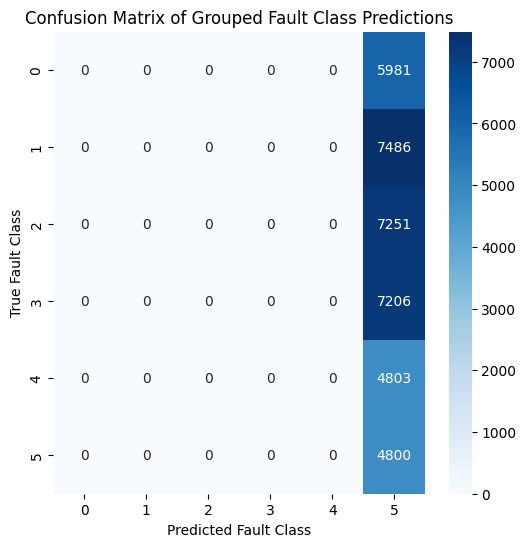

Model: Random Forest
Accuracy: 0.9876
Precision: 0.9926
Recall: 0.9972
F1-Score: 0.9949



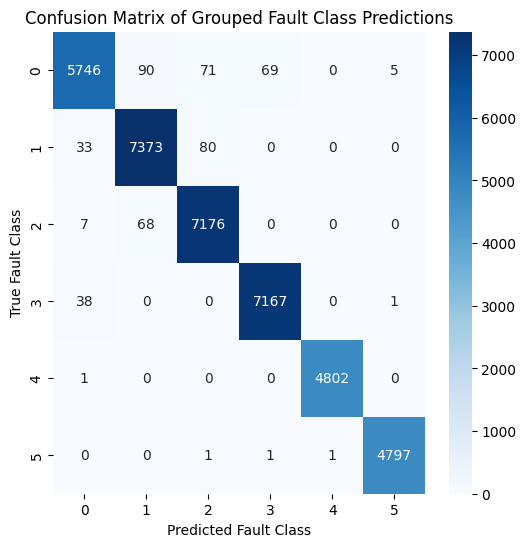

Model: K-Nearest Neighbors
Accuracy: 0.9789
Precision: 0.9872
Recall: 0.9940
F1-Score: 0.9906



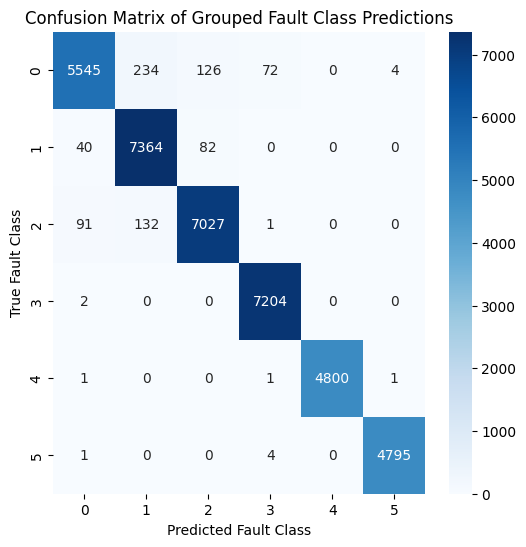

Model: Naive Bayes
Accuracy: 0.4716
Precision: 0.8570
Recall: 0.8670
F1-Score: 0.8615



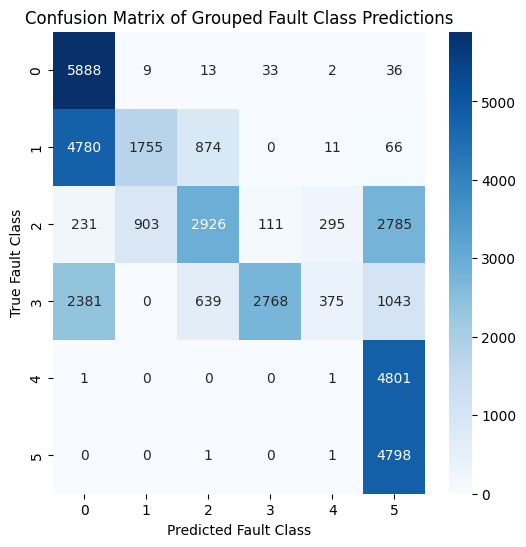

Model: Gradient Boosting
Accuracy: 0.9112
Precision: 0.9844
Recall: 0.9631
F1-Score: 0.9733



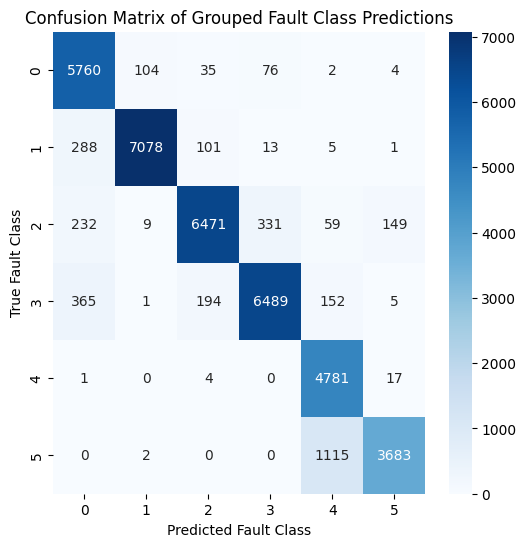

In [51]:
x_train_models = x_train.drop(columns=['A', 'B', 'C', 'G'])
x_test_models = x_test.drop(columns=['A', 'B', 'C', 'G'])

y_test_models = x_test[['A', 'B', 'C', 'G']]
y_train_models = x_train[['A', 'B', 'C', 'G']]
results = {}
trained_models = {}
# Train and evaluate each model
for name, model in models.items():
    model_instance = model

    model_instance.fit(x_train_models, y_train)
    y_pred = model_instance.predict(x_test_models)

    y_test_fault_classes = convert_predictions_to_fault_classes(y_test_models.values)
    y_pred_fault_classes = convert_predictions_to_fault_classes(y_pred)

    acc = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    trained_models[name] = model_instance

    results[name] = {"Accuracy": acc, "Precision": precision, "Recall": recall, "F1-Score": f1}

    print(f"Model: {name}")
    print(f"Accuracy: {acc:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1-Score: {f1:.4f}\n")

    # Compute confusion matrix
    cm = confusion_matrix(y_test_fault_classes, y_pred_fault_classes)
    unique_classes = sorted(set(y_test_fault_classes))  # Ensure unique, sorted classes
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=unique_classes,
            yticklabels=unique_classes)
    plt.title("Confusion Matrix of Grouped Fault Class Predictions")
    plt.xlabel("Predicted Fault Class")
    plt.ylabel("True Fault Class")
    plt.show()

We Compare the models now


Model Performance Summary:
                     Accuracy  Precision    Recall  F1-Score
Logistic Regression  0.127908   0.568908  1.000000  0.723920
Random Forest        0.987556   0.992554  0.997192  0.994867
K-Nearest Neighbors  0.978895   0.987239  0.994017  0.990613
Naive Bayes          0.471607   0.856953  0.866955  0.861495
Gradient Boosting    0.911237   0.984434  0.963066  0.973319


<Figure size 1000x600 with 0 Axes>

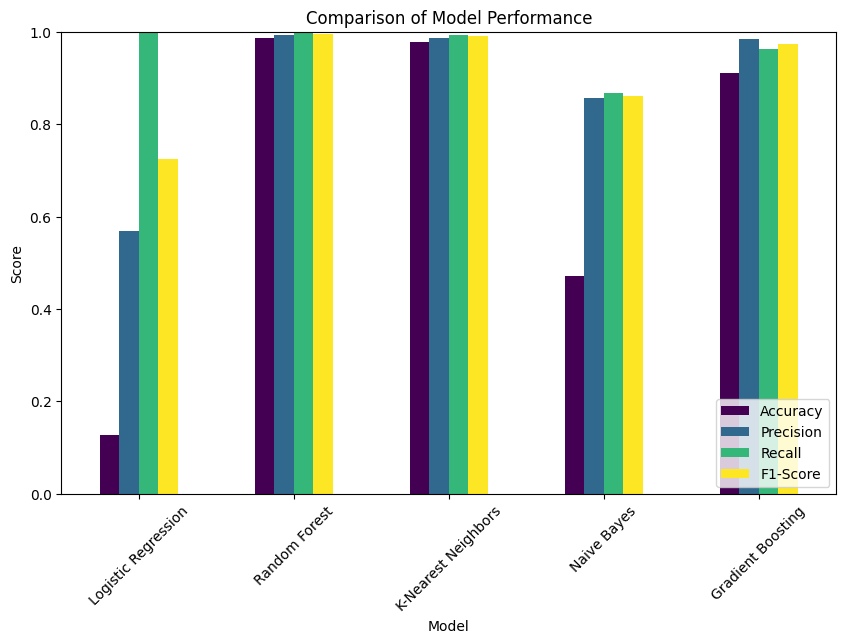

In [52]:
results_df = pd.DataFrame(results).T  # Transpose for better readability

# Print results as a table
print("\nModel Performance Summary:")
print(results_df)

# Plot comparison of models
plt.figure(figsize=(10, 6))
results_df.plot(kind='bar', figsize=(10, 6), colormap="viridis")
plt.title("Comparison of Model Performance")
plt.xlabel("Model")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=45)
plt.legend(loc="lower right")
plt.show()

Plot ROC curve

Logistic Regression - Matthews Correlation Coefficient (MCC): 0.0000
Logistic Regression - Average Multiclass ROC-AUC Score (OVR, Weighted): 0.5002


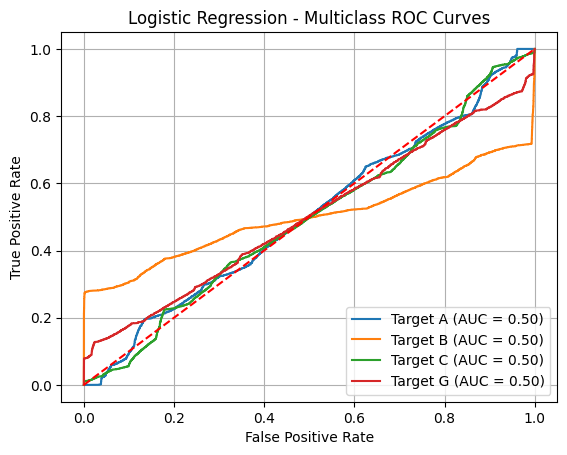

Random Forest - Matthews Correlation Coefficient (MCC): 0.9880
Random Forest - Average Multiclass ROC-AUC Score (OVR, Weighted): 0.9975


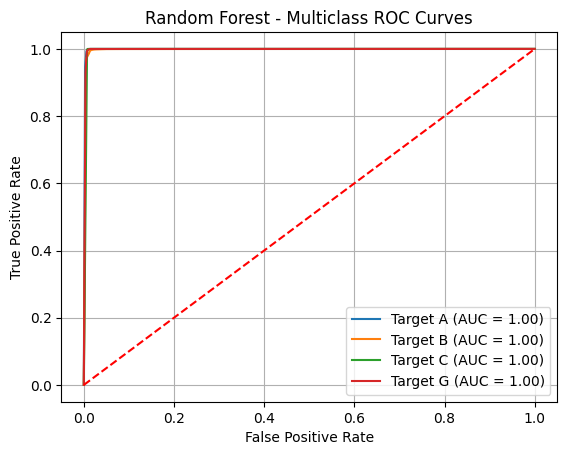

K-Nearest Neighbors - Matthews Correlation Coefficient (MCC): 0.9781
K-Nearest Neighbors - Average Multiclass ROC-AUC Score (OVR, Weighted): 0.9970


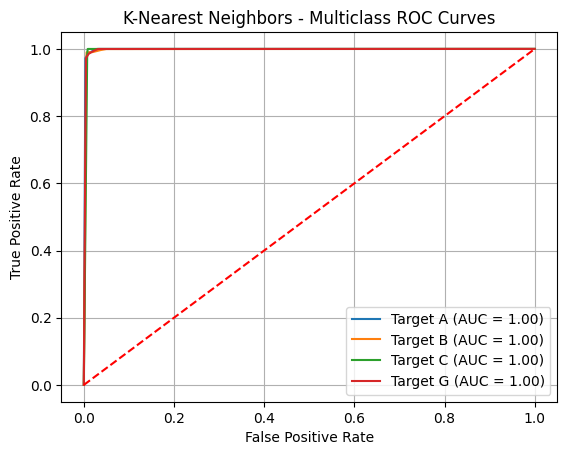

Naive Bayes - Matthews Correlation Coefficient (MCC): 0.6754
Naive Bayes - Average Multiclass ROC-AUC Score (OVR, Weighted): 0.9028


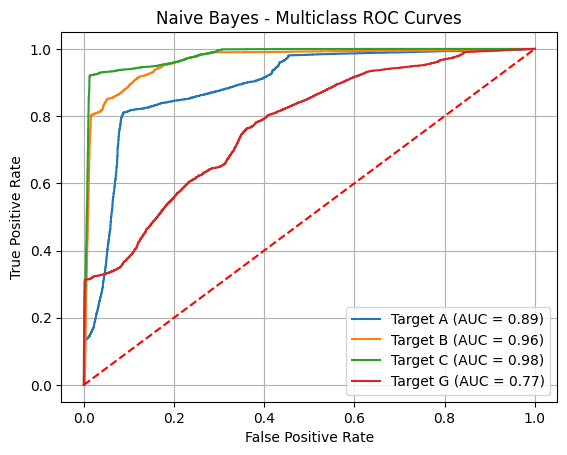

Gradient Boosting - Matthews Correlation Coefficient (MCC): 0.9412
Gradient Boosting - Average Multiclass ROC-AUC Score (OVR, Weighted): 0.9898


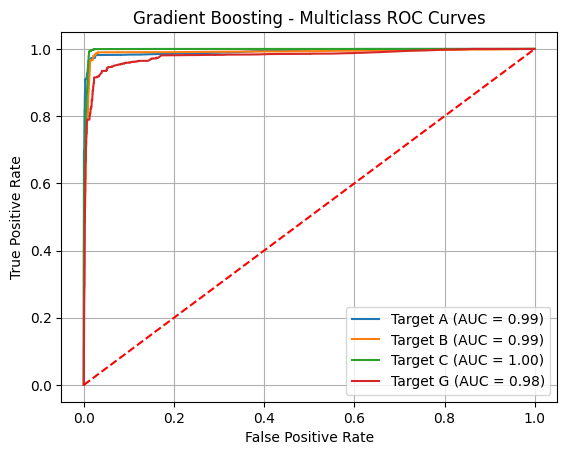

In [53]:
from sklearn.metrics import matthews_corrcoef, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import numpy as np

for name, model in models.items():
    y_pred = model.predict(x_test_models)

    # Calculate MCC for each target variable separately and then average
    mcc_scores = []
    for i in range(y_test.shape[1]):
        mcc = matthews_corrcoef(y_test.iloc[:, i], y_pred[:, i])  # Access each column using iloc
        mcc_scores.append(mcc)
    avg_mcc = np.mean(mcc_scores)
    print(f"{name} - Matthews Correlation Coefficient (MCC): {avg_mcc:.4f}")

    # Multiclass ROC-AUC using 'ovr' (One-vs-Rest)
    try:
        y_pred_prob = model.predict_proba(x_test_models)
        # Assuming y_pred_prob is a list of probabilities for each target variable
        roc_auc_scores = []

        # Iterate through target variables (columns in y_test)
        for i in range(y_test.shape[1]):
            # Check if predict_proba returned probabilities for this target variable
            if isinstance(y_pred_prob, list) and len(y_pred_prob) > i and y_pred_prob[i].shape[1] > 1:
                # Calculate ROC-AUC for this target variable
                roc_auc = roc_auc_score(y_test.iloc[:, i], y_pred_prob[i][:, 1], average='weighted')
                roc_auc_scores.append(roc_auc)

                # Plot ROC Curve for this target variable
                fpr, tpr, _ = roc_curve(y_test.iloc[:, i], y_pred_prob[i][:, 1])
                plt.plot(fpr, tpr, label=f"Target {y_test.columns[i]} (AUC = {roc_auc:.2f})")
            else:
                print(f"Skipping ROC-AUC and plot for target {y_test.columns[i]} due to predict_proba output.")

        # Calculate average ROC-AUC if scores were calculated
        if roc_auc_scores:
            avg_roc_auc = np.mean(roc_auc_scores)
            print(f"{name} - Average Multiclass ROC-AUC Score (OVR, Weighted): {avg_roc_auc:.4f}")

        # Plot configuration
        plt.plot([0, 1], [0, 1], color='red', linestyle='--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f"{name} - Multiclass ROC Curves")
        plt.legend(loc='lower right')
        plt.grid()
        plt.show()

    except AttributeError:
        print(f"{name} does not support predict_proba, skipping ROC-AUC calculation.\n")

#Visualizing

In [54]:
df.head()

,A,B,C,G,Va,Vb,Vc,Ia,Ib,Ic,Ig,Fault_Type
0,0.0,0.0,0.0,0.0,0.174978,-0.870426,0.695449,-154.831976,-16.966878,171.798854,-1.510000e-14,0.0
1,0.0,0.0,0.0,0.0,0.189155,-0.875032,0.685877,-153.099111,-19.923338,173.022448,-1.440000e-14,0.0
2,0.0,0.0,0.0,0.0,0.203286,-0.879422,0.676137,-151.328543,-22.874744,174.203286,-1.380000e-14,0.0
3,0.0,0.0,0.0,0.0,0.217366,-0.883594,0.666228,-149.520367,-25.819661,175.340027,-1.310000e-14,0.0
4,0.0,0.0,0.0,0.0,0.231392,-0.887548,0.656156,-147.675418,-28.758374,176.433792,-1.250000e-14,0.0


# We are going to print the faults to check whether we have extremely fatal fautls or not, by geting at which rows the faults are heppening and trying to evaluate where the errors happen

In [55]:
from IPython.display import display, HTML
import pandas as pd

# Get trained Random Forest model
rfc = trained_models["Random Forest"]
y_pred = pd.DataFrame(rfc.predict(x_test_models), columns=y_test_models.columns, index=x_test_models.index)

# Identify misclassified rows
misclassified_indices = (y_test_models != y_pred).any(axis=1)
misclassified_df = x_test_models[misclassified_indices].copy()

# Add actual and predicted binary codes
misclassified_df["Actual Binary Code"] = y_test_models[misclassified_indices].astype(str).agg("".join, axis=1)
misclassified_df["Predicted Binary Code"] = y_pred[misclassified_indices].astype(str).agg("".join, axis=1)

# Display misclassified rows as formatted HTML cards
for index, row in misclassified_df.iterrows():
    feature_html = "".join(
        [f"<br><b>{feature}:</b> {row[feature]}" for feature in ['Ia', 'Ib', 'Ic', 'Va', 'Vb', 'Vc', 'Ig']]
    )

    card_html = f"""
    <div style="border: 1px solid #ccc; padding: 10px; margin-bottom: 10px;">
        <b>Row Index:</b> {index}<br>
        <b>Actual Binary Code:</b> {row["Actual Binary Code"]}<br>
        <b>Predicted Binary Code:</b> {row["Predicted Binary Code"]}<br>
        <b>Feature Values:</b> {feature_html}
    </div>
    """
    display(HTML(card_html))


# We are going to train an unsupervised learning model to avoid wrong inputs by the users

In [56]:
# Train IF on all available user data
features = [ 'Va', 'Vb', 'Vc','Ia', 'Ib', 'Ic', 'Ig']
x_train_if = scaled_df[features]

from sklearn.neighbors import LocalOutlierFactor

# Train with novelty=False to only detect anomalies in the training data
lof = LocalOutlierFactor(n_neighbors=10, contamination=0.01, novelty=True)

# Fit on the training data (scaled_df)
lof.fit(scaled_df[features])  # Fit only on features used for prediction

# Predict on the scaled training data to classify anomalies and normal points
y_pred = lof.predict(scaled_df[features])  # -1 = anomaly, 1 = normal

# Optional: convert predictions to readable labels
labels = np.where(y_pred == -1, "Anomaly", "Normal")

# Create a copy of the DataFrame to avoid modifying the original data
lof_results = scaled_df.copy()

# Add the LOF prediction labels to the DataFrame
lof_results['Anomaly'] = labels

# Print anomaly counts
print("Anomaly count:")
print(lof_results['Anomaly'].value_counts())

Anomaly count:
Anomaly
Normal     186031
Anomaly      1602
Name: count, dtype: int64


Trying to see how a simple setup wil look like and making sure the LOF will work efficiently

In [57]:
test_data = np.array([
    [-0.501840, -1.376022, -1.917662, -1.266382,  0.447412,  1.140704,  0.430179]
])
# Convert the data into a DataFrame for easy inspection
test_df = pd.DataFrame(test_data, columns=['Va', 'Vb', 'Vc', 'Ia', 'Ib', 'Ic', 'Ig'])

In [58]:
import time

rfc = trained_models["Random Forest"]

scaled_test_data = test_df.copy()

scaled_test_data[['Va', 'Vb', 'Vc']] = voltage_scaler.transform(scaled_test_data[['Va', 'Vb', 'Vc']])

scaled_test_data[['Ia', 'Ib', 'Ic']] = current_scaler.transform(scaled_test_data[['Ia', 'Ib', 'Ic']])

scaled_test_data[['Ig']] = current_gscaler.transform(scaled_test_data[['Ig']])

start_time = time.time()
test_predictions = lof.predict(test_data)
end_time = time.time()
test_predictionss = rfc.predict(test_data)

# Convert the predictions (-1 for anomalies, 1 for normal) into readable labels
test_df['Anomaly'] = np.where(test_predictions == -1, "Anomaly", "Normal")

time_taken = end_time - start_time

print(f"Time taken for prediction: {time_taken:.6f} seconds")
# Display the results
print(test_data)
print(y_test_models[:5])
print(test_predictions)
print(test_predictionss)

Time taken for prediction: 0.001906 seconds
[[-0.50184  -1.376022 -1.917662 -1.266382  0.447412  1.140704  0.430179]]
        A  B  C  G
69103   0  1  0  1
119199  1  1  1  0
2411    1  0  0  1
93607   1  1  0  0
19195   1  0  0  1
[-1]
[[1 1 1 1]]


#We'll downlaod the IOF model now and the RFC model

In [59]:
import joblib

joblib.dump(rfc, 'rfc_model.joblib')
joblib.dump(lof, "lof_model.joblib")

['lof_model.joblib']

We have tried training some shapes of neural network but the best result we got was like our RFC , we might work more on training neural networks in the future since even  if its performance is like the rfc it can generalize better and might help more with areas like fault prediction or localization